# Analysis of results for different parameters

## Metrics:
all metrics are calculated for each vType and averaged over many reps.
trip duration: average duration of all trips
depart delay: average delay of all trips
speed: average speed of all trips
timeLoss: average time loss of all trips in comparison to maximum possible speed

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [10]:
POLICY_NAMES = ["ClearFront", "Nothing"]
FLOWS = [1000,2000,3000,4000,5000]
METRICS = ["duration","speed", "departDelay", "timeLoss", "totalDelay"]
vTypes = ["emergency", "HD","AV", "all"]

fontsize = 20

ClearFront: Num of emergency vehicles: 64.0


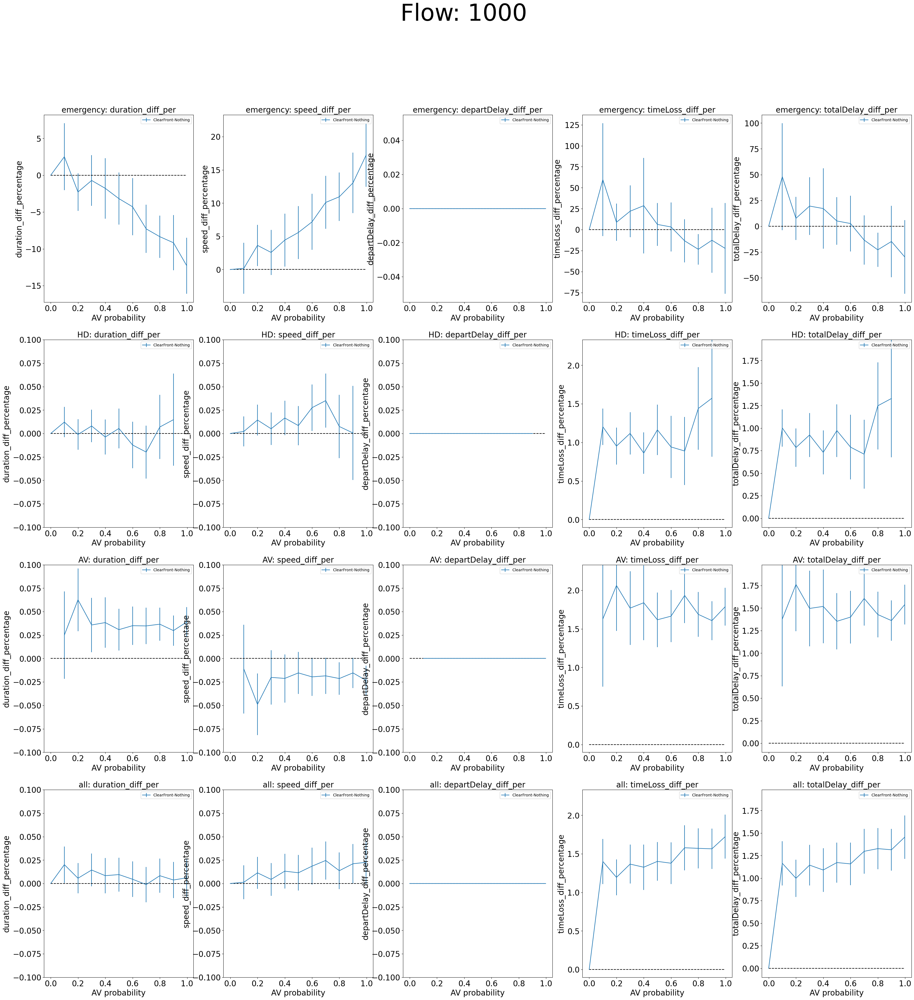

ClearFront: Num of emergency vehicles: 138.0


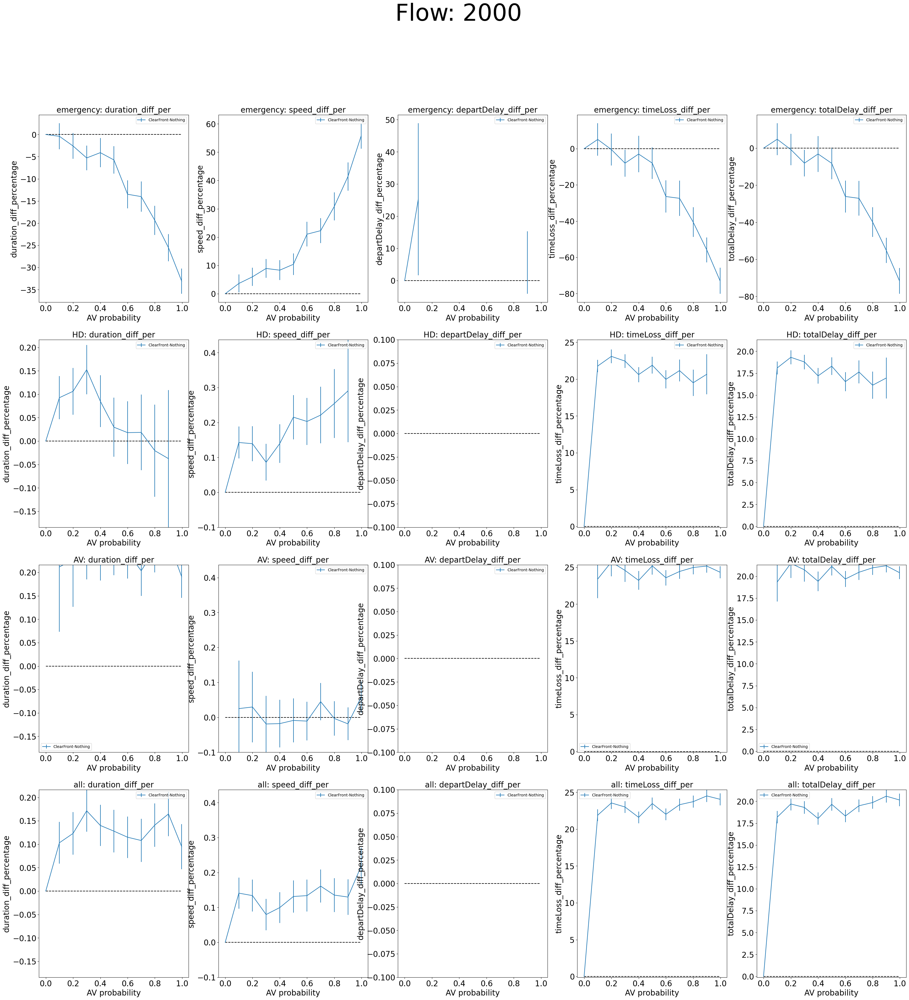

ClearFront: Num of emergency vehicles: 214.0


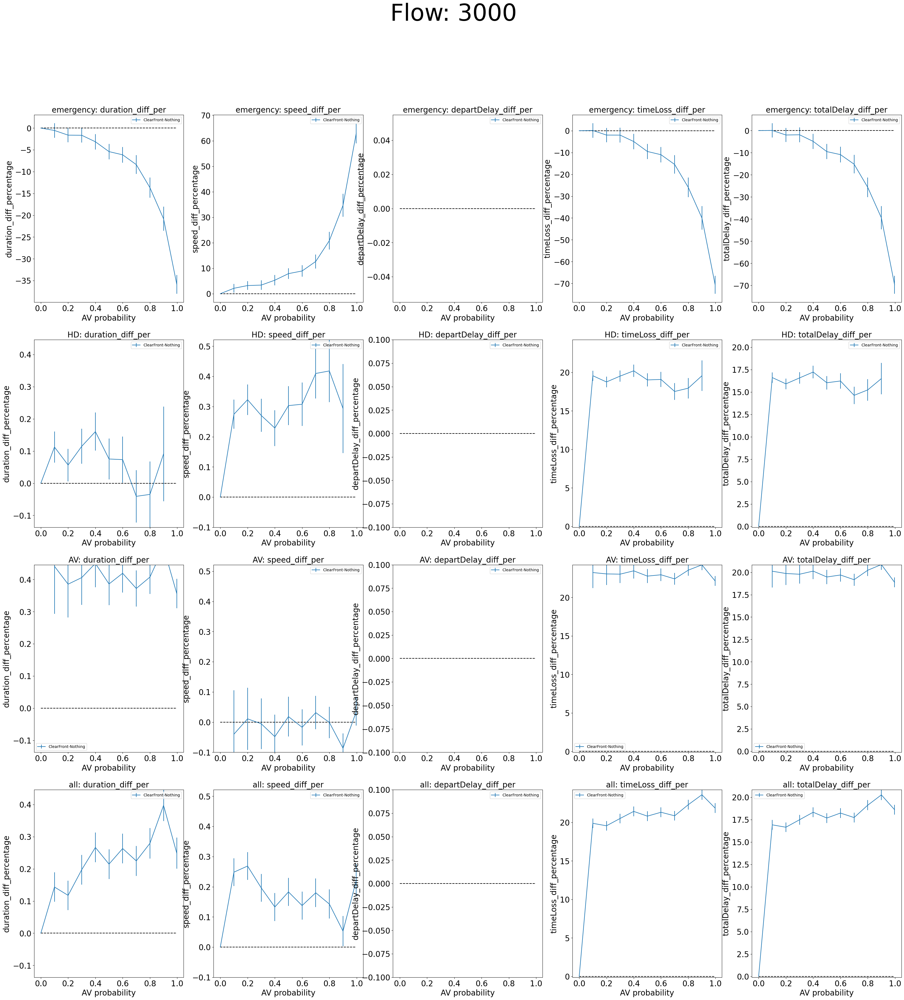

ClearFront: Num of emergency vehicles: 290.0


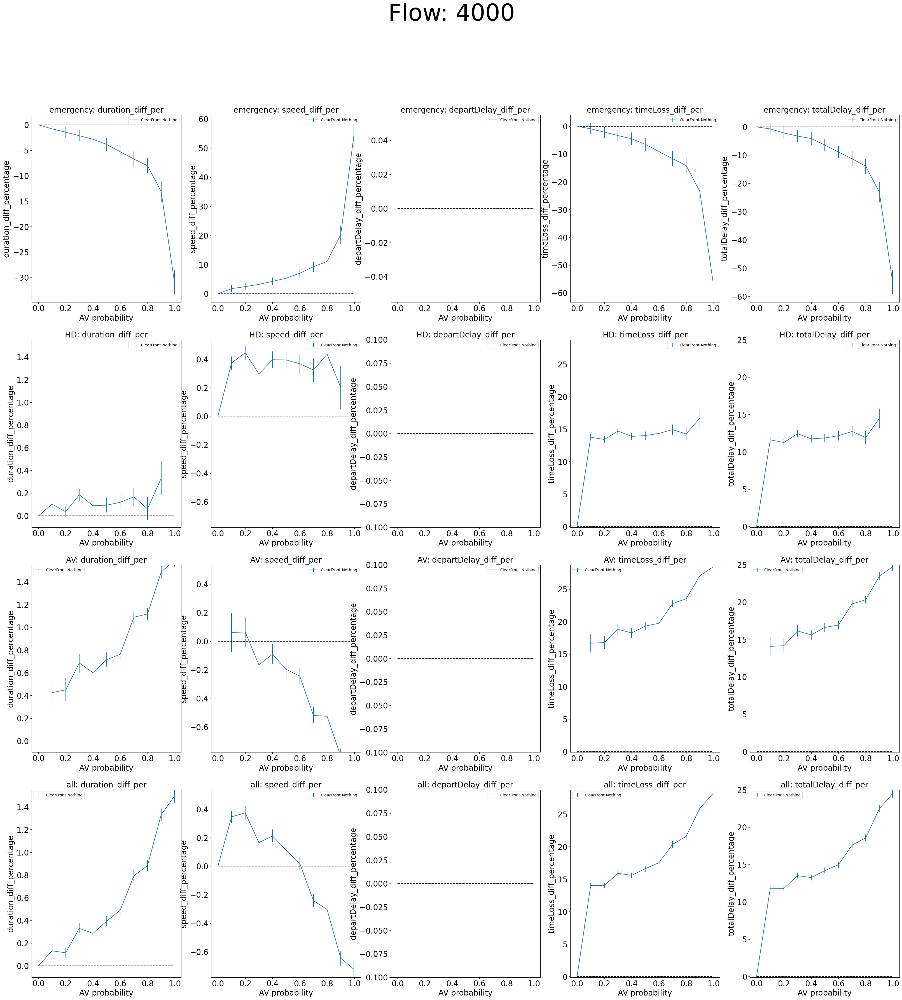

ClearFront: Num of emergency vehicles: 349.0


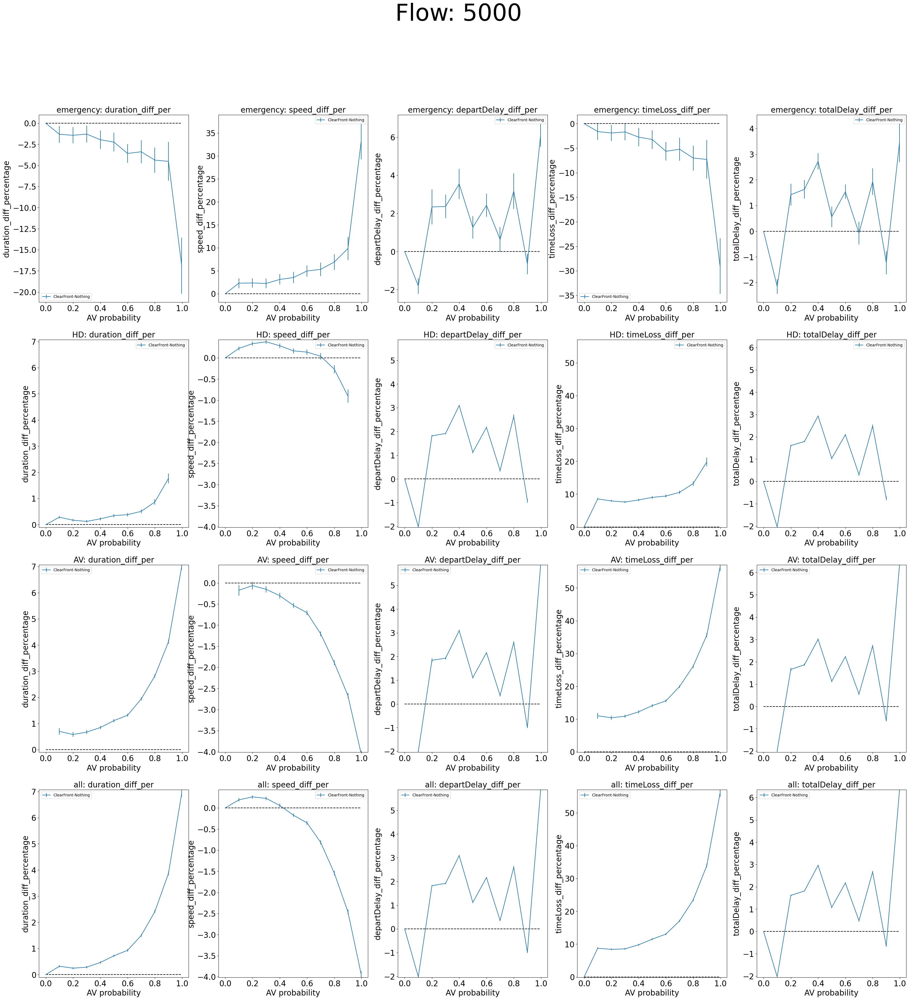

In [30]:
for flow in FLOWS:
    fig, axs = plt.subplots(len(vTypes), len(METRICS), figsize=(40, 40))
    fig.suptitle('Flow: {}'.format(flow), fontsize=fontsize*3)
    metrics_lims_plot = {"duration_diff": (-0.1,0.1), "speed_diff": (-0.1,0.1), "departDelay_diff": (-0.1,0.1), "timeLoss_diff": (-0.1,0.1), "totalDelay_diff": (-0.1,0.1)}
    for policy in ["ClearFront","HD50","ClearFront_HD50"]:
        df = pd.read_pickle("results_csvs_server_dur86400/{}_Nothing_flow_{}_long.pkl".format(policy, flow))
        print(policy + ": Num of emergency vehicles: "+ str(df["emergency"]["count"][0]))

        for i, vType in enumerate(vTypes):
            for j, metric in enumerate(METRICS):
                metric += "_diff"
                err = df[vType][f"std_{metric}"]/df[vType]["count"].pow(1/2)*1.96
                # err = df[vType][f"std_{metric}"]
                axs[i,j].errorbar(df.index, df[vType][f"avg_{metric}"], yerr=err
                                    , label=policy+"-Nothing")
                # Plot zero line
                axs[i,j].plot(df.index, np.zeros(len(df.index)), color="black", linestyle="--")
                axs[i,j].set_title("{}: {}".format(vType, metric+"_per"), fontsize=fontsize)
                axs[i,j].set_xlabel("AV probability", fontsize=fontsize)
                axs[i,j].set_ylabel(metric+"_percentage", fontsize=fontsize)
                axs[i,j].tick_params(axis='both', which='major', labelsize=fontsize)
                axs[i,j].legend()
                # Set limits
                if vType != "emergency":
                    metrics_lims_plot[metric] = (min(metrics_lims_plot[metric][0], min(df[vType][f"avg_{metric}"]-err)), max(metrics_lims_plot[metric][1], max(df[vType][f"avg_{metric}"]+err)))
    for i, vType in enumerate(vTypes):
        if vType == "emergency":
            continue
        for j, metric in enumerate(METRICS):
            metric += "_diff"
            if metrics_lims_plot[metric][0] == metrics_lims_plot[metric][1]:
                continue
            axs[i,j].set_ylim(metrics_lims_plot[metric])
    plt.show()

ClearFront: Num of emergency vehicles: 64.0
HD50: Num of emergency vehicles: 64.0
ClearFront_HD50: Num of emergency vehicles: 64.0
ClearFront500: Num of emergency vehicles: 64.0
ClearFront500_HD50: Num of emergency vehicles: 64.0


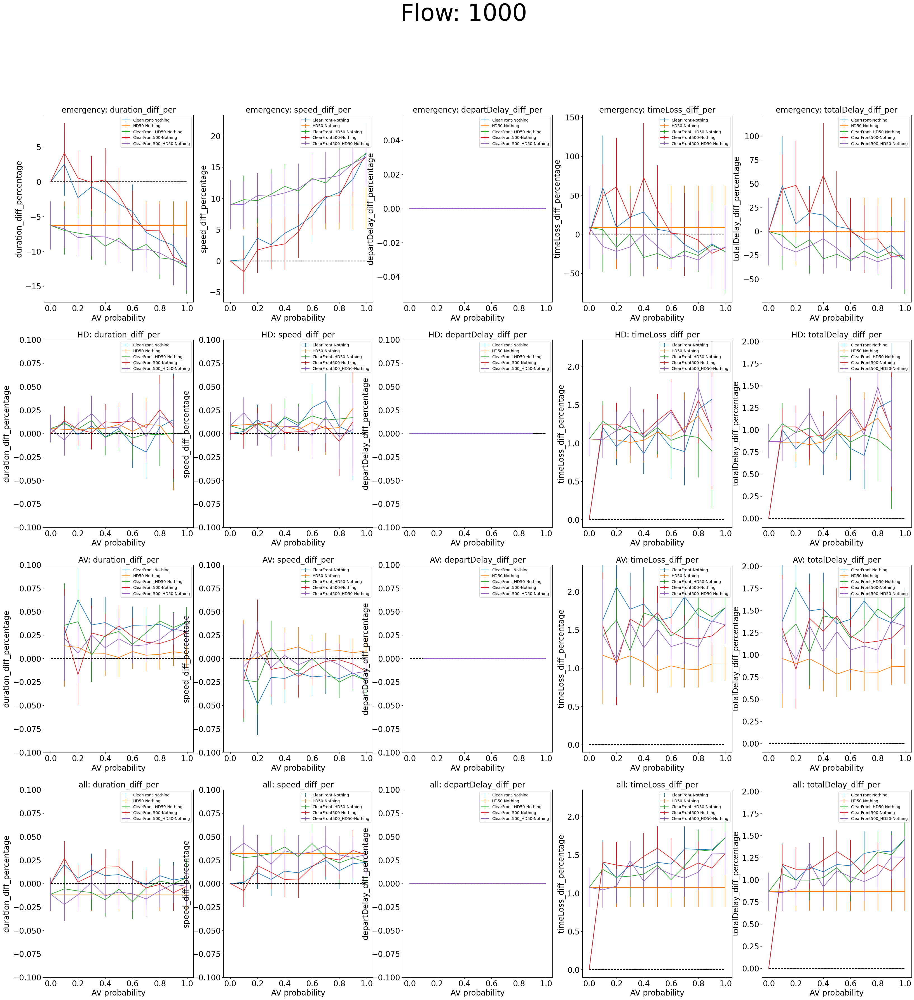

ClearFront: Num of emergency vehicles: 138.0
HD50: Num of emergency vehicles: 138.0
ClearFront_HD50: Num of emergency vehicles: 138.0
ClearFront500: Num of emergency vehicles: 138.0
ClearFront500_HD50: Num of emergency vehicles: 138.0


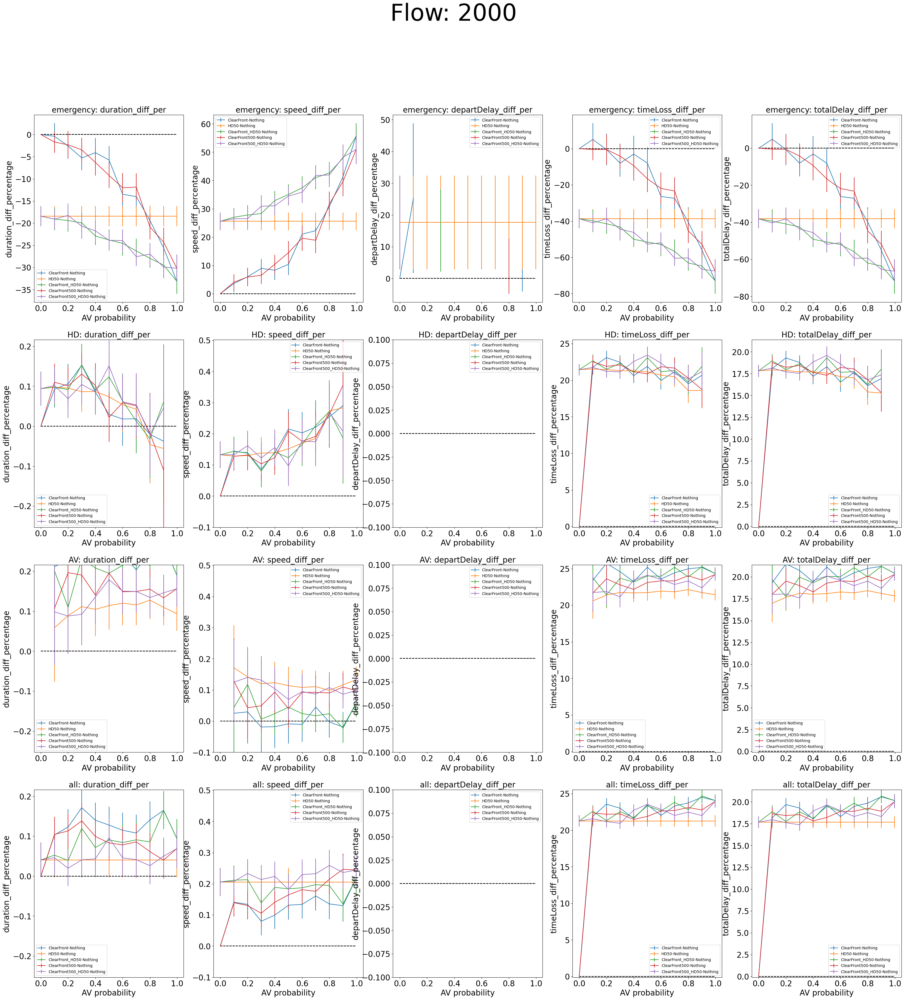

ClearFront: Num of emergency vehicles: 214.0
HD50: Num of emergency vehicles: 214.0
ClearFront_HD50: Num of emergency vehicles: 214.0
ClearFront500: Num of emergency vehicles: 214.0
ClearFront500_HD50: Num of emergency vehicles: 214.0


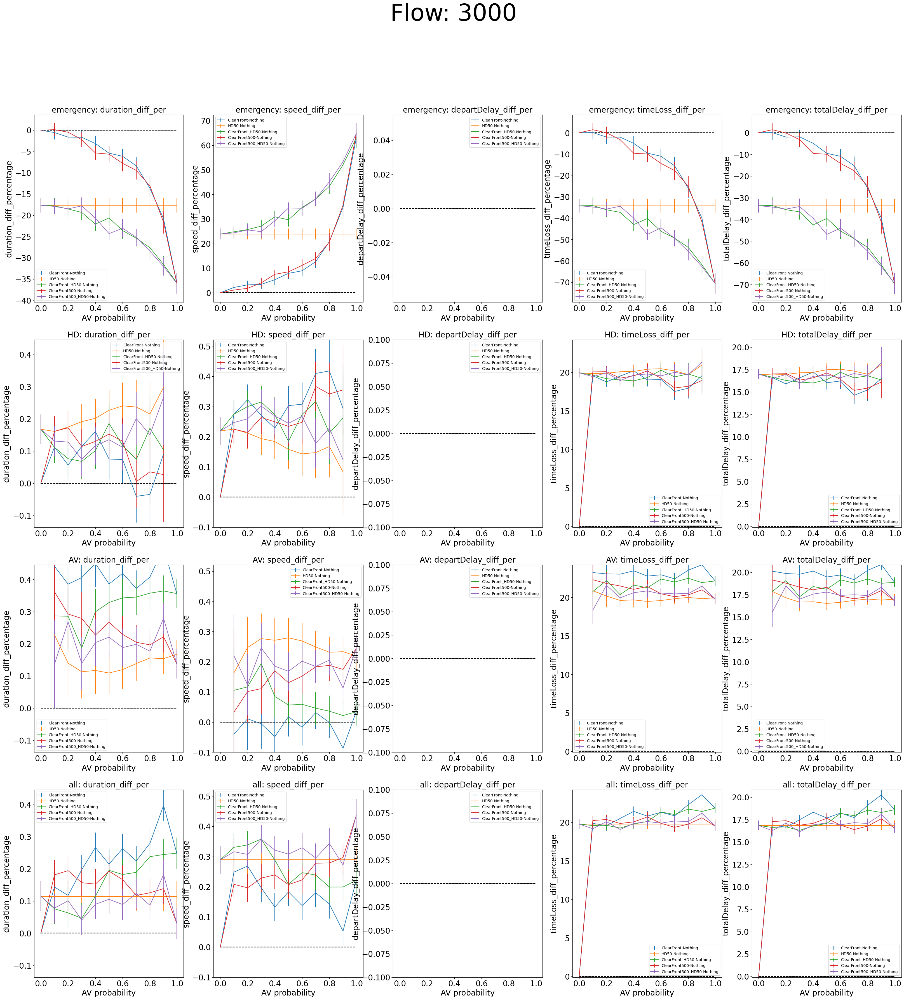

ClearFront: Num of emergency vehicles: 290.0
HD50: Num of emergency vehicles: 290.0
ClearFront_HD50: Num of emergency vehicles: 290.0
ClearFront500: Num of emergency vehicles: 290.0
ClearFront500_HD50: Num of emergency vehicles: 290.0


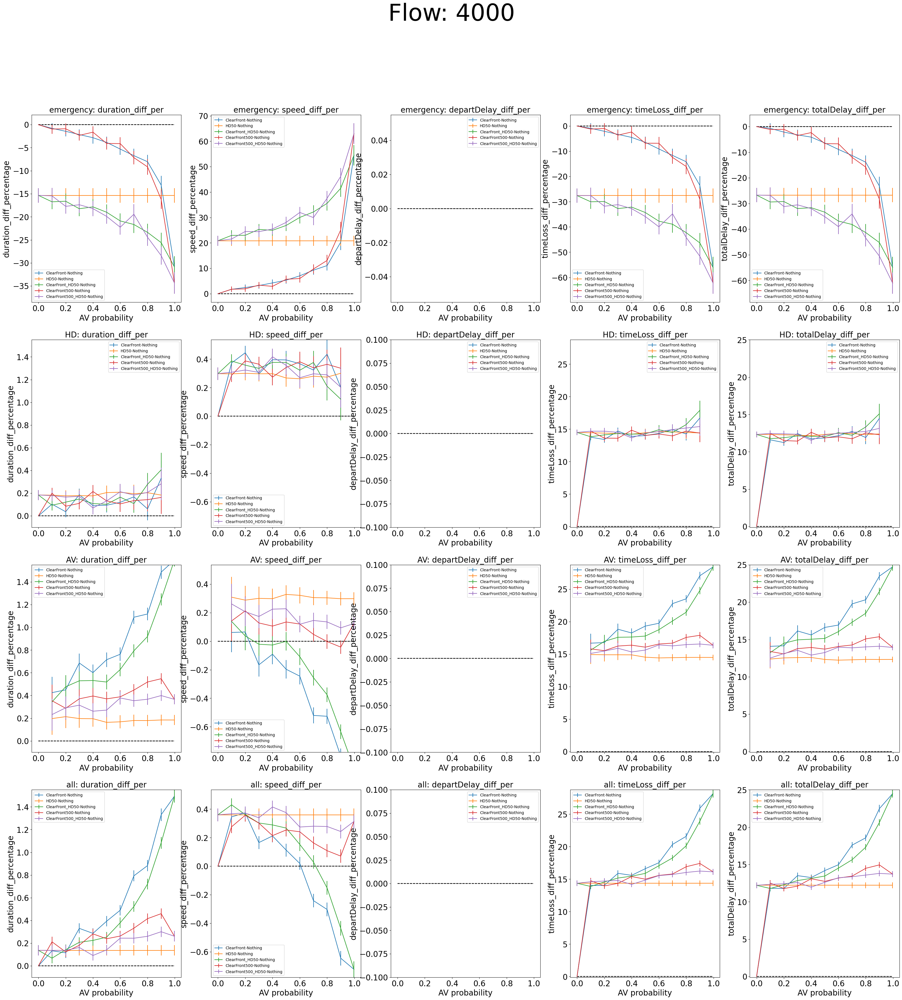

ClearFront: Num of emergency vehicles: 349.0
HD50: Num of emergency vehicles: 349.0
ClearFront_HD50: Num of emergency vehicles: 349.0
ClearFront500: Num of emergency vehicles: 349.0
ClearFront500_HD50: Num of emergency vehicles: 349.0


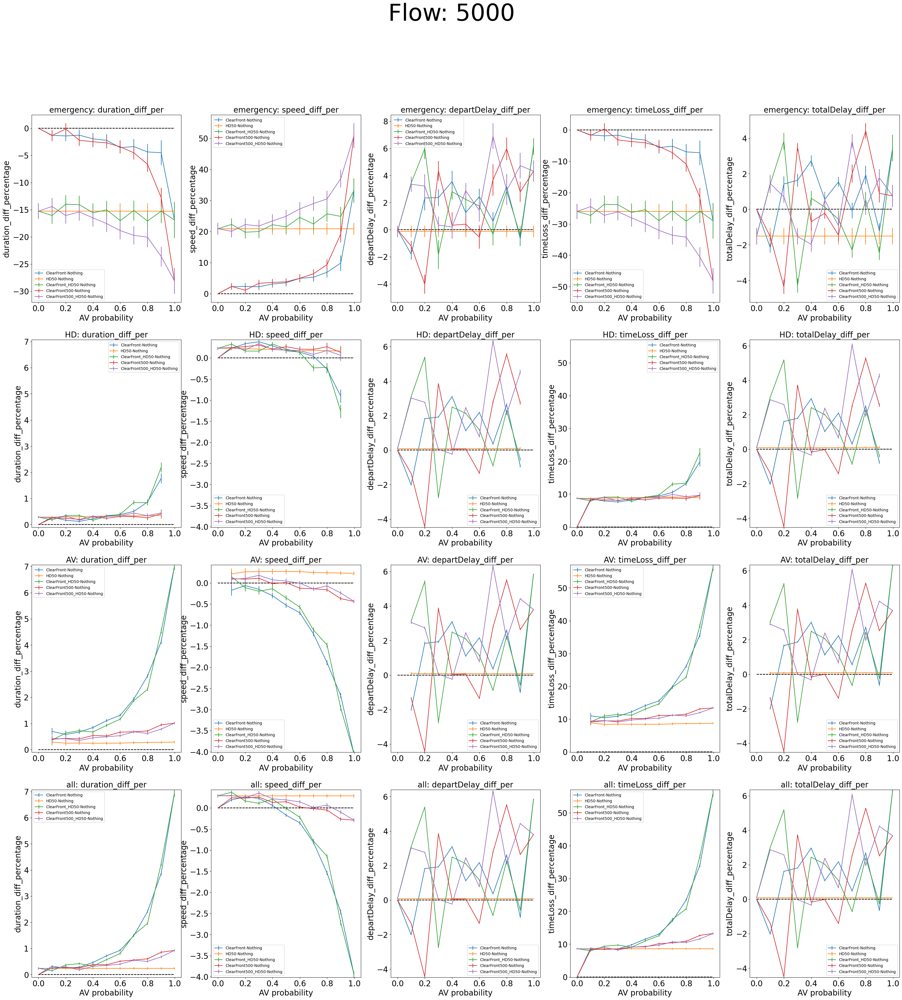

In [33]:
for flow in FLOWS:
    fig, axs = plt.subplots(len(vTypes), len(METRICS), figsize=(40, 40))
    fig.suptitle('Flow: {}'.format(flow), fontsize=fontsize*3)
    metrics_lims_plot = {"duration_diff": (-0.1,0.1), "speed_diff": (-0.1,0.1), "departDelay_diff": (-0.1,0.1), "timeLoss_diff": (-0.1,0.1), "totalDelay_diff": (-0.1,0.1)}
    for policy in ["ClearFront","HD50","ClearFront_HD50", "ClearFront500","ClearFront500_HD50"]:
        df = pd.read_pickle("results_csvs_server_dur86400/{}_Nothing_flow_{}_long.pkl".format(policy, flow))
        print(policy + ": Num of emergency vehicles: "+ str(df["emergency"]["count"][0]))

        for i, vType in enumerate(vTypes):
            for j, metric in enumerate(METRICS):
                metric += "_diff"
                err = df[vType][f"std_{metric}"]/df[vType]["count"].pow(1/2)*1.96
                # err = df[vType][f"std_{metric}"]
                axs[i,j].errorbar(df.index, df[vType][f"avg_{metric}"], yerr=err
                                    , label=policy+"-Nothing")
                # Plot zero line
                axs[i,j].plot(df.index, np.zeros(len(df.index)), color="black", linestyle="--")
                axs[i,j].set_title("{}: {}".format(vType, metric+"_per"), fontsize=fontsize)
                axs[i,j].set_xlabel("AV probability", fontsize=fontsize)
                axs[i,j].set_ylabel(metric+"_percentage", fontsize=fontsize)
                axs[i,j].tick_params(axis='both', which='major', labelsize=fontsize)
                axs[i,j].legend()
                # Set limits
                if vType != "emergency":
                    metrics_lims_plot[metric] = (min(metrics_lims_plot[metric][0], min(df[vType][f"avg_{metric}"]-err)), max(metrics_lims_plot[metric][1], max(df[vType][f"avg_{metric}"]+err)))
    for i, vType in enumerate(vTypes):
        if vType == "emergency":
            continue
        for j, metric in enumerate(METRICS):
            metric += "_diff"
            if metrics_lims_plot[metric][0] == metrics_lims_plot[metric][1]:
                continue
            axs[i,j].set_ylim(metrics_lims_plot[metric])\
    plt.show()

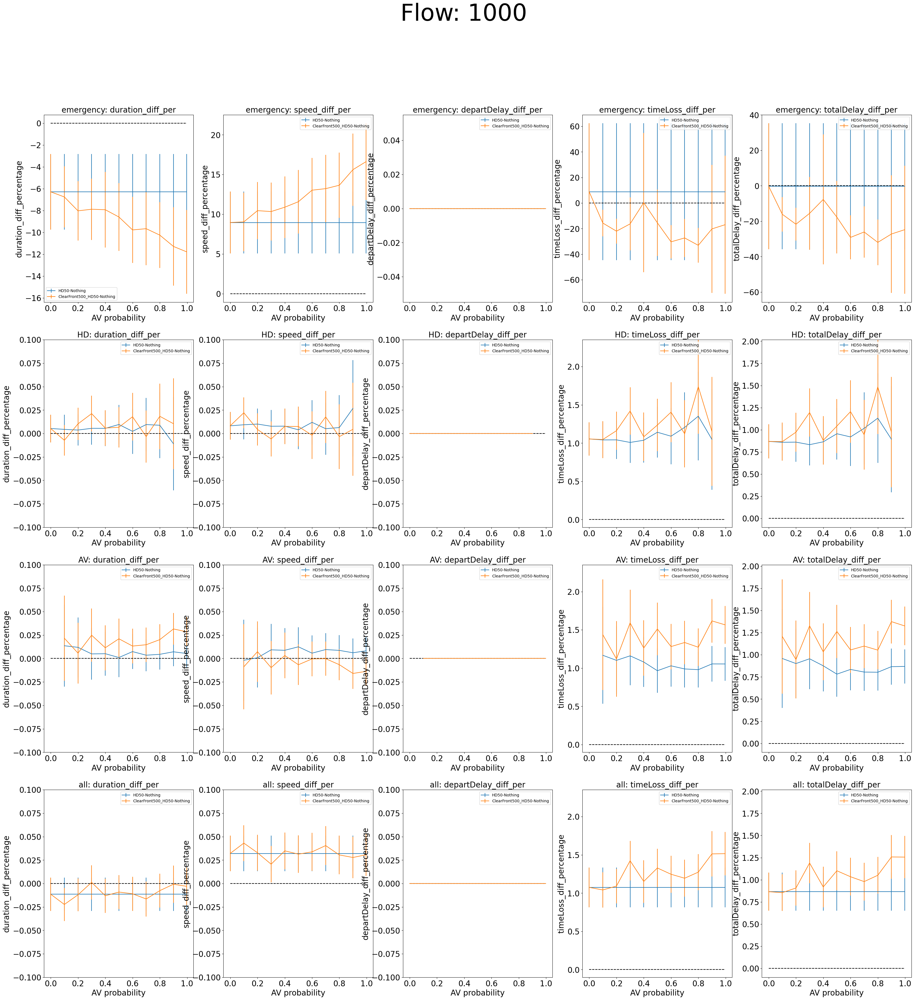

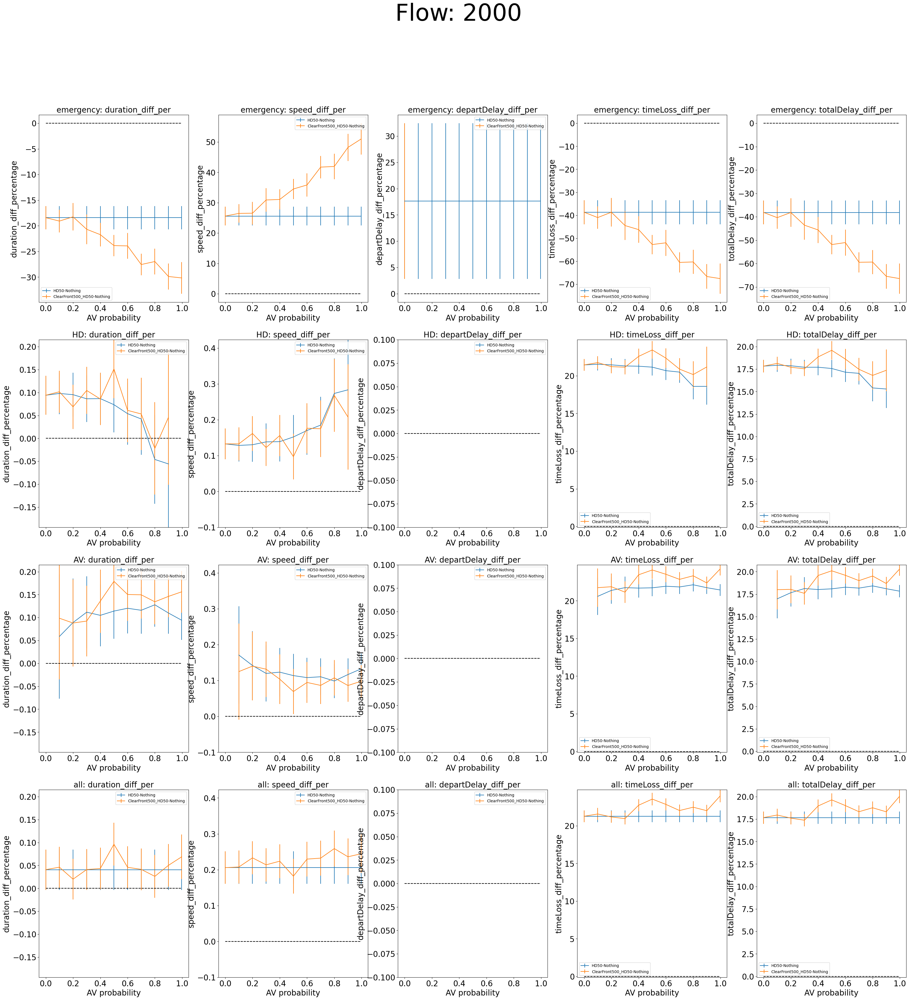

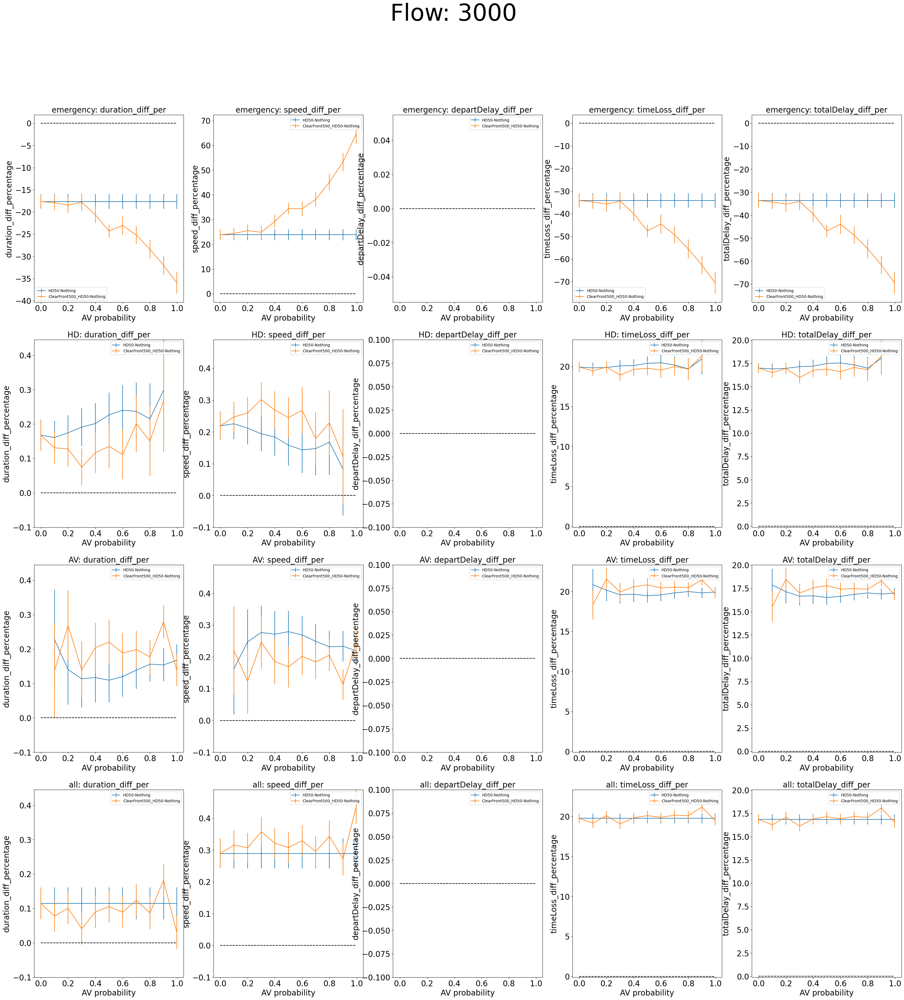

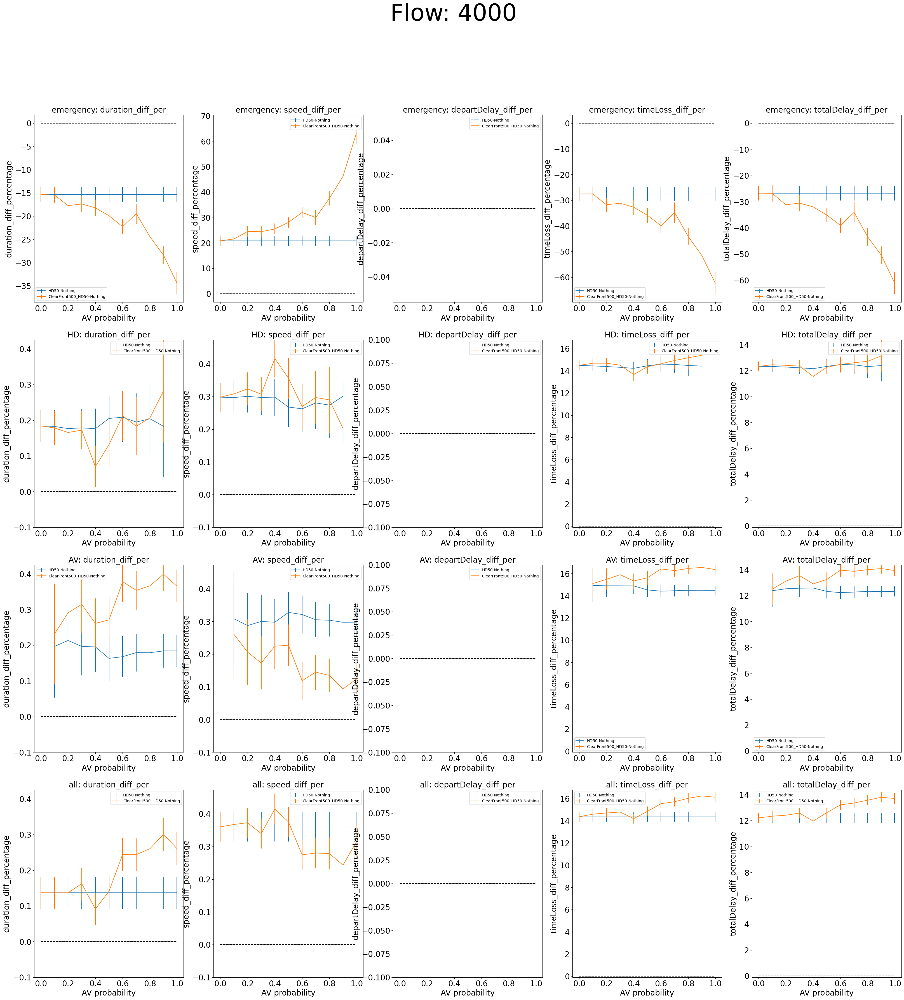

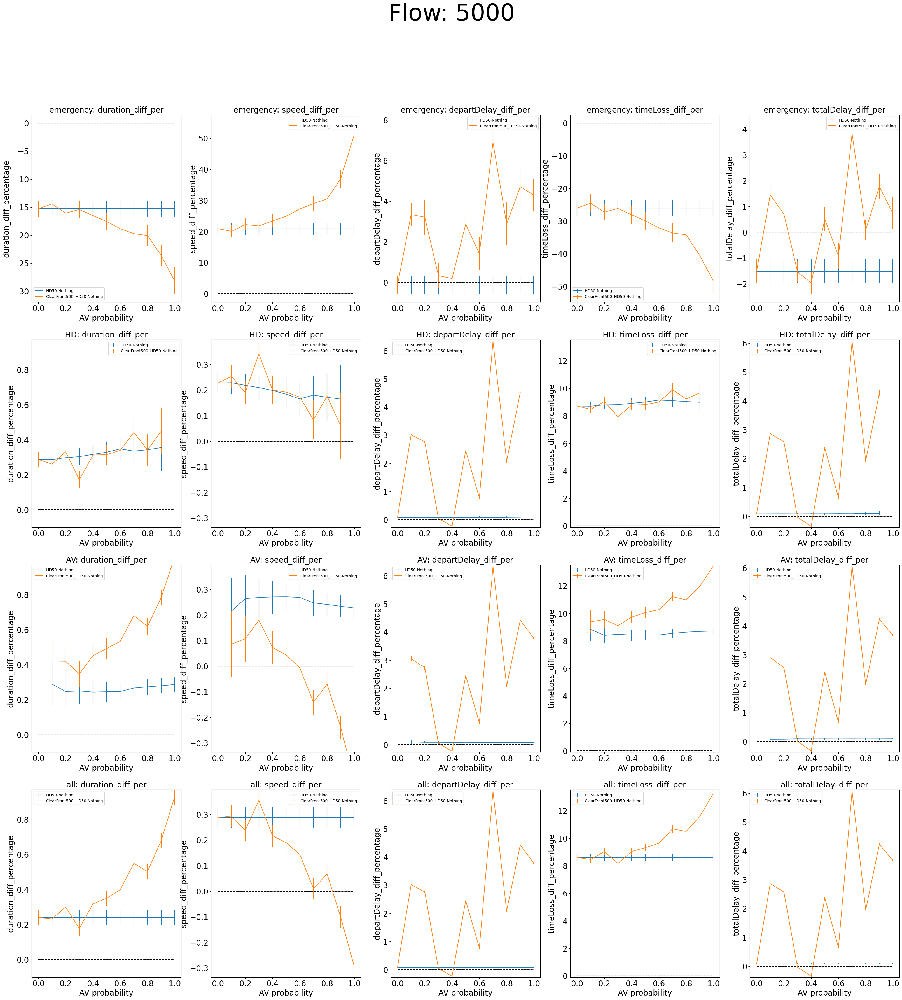

In [36]:
for flow in FLOWS:
    fig, axs = plt.subplots(len(vTypes), len(METRICS), figsize=(40, 40))
    fig.suptitle('Flow: {}'.format(flow), fontsize=fontsize*3)
    metrics_lims_plot = {"duration_diff": (-0.1,0.1), "speed_diff": (-0.1,0.1), "departDelay_diff": (-0.1,0.1), "timeLoss_diff": (-0.1,0.1), "totalDelay_diff": (-0.1,0.1)}
    for policy in ["HD50","ClearFront500_HD50"]:
        df = pd.read_pickle("results_csvs_server_dur86400/{}_Nothing_flow_{}_long.pkl".format(policy, flow))
        for i, vType in enumerate(vTypes):
            for j, metric in enumerate(METRICS):
                metric += "_diff"
                err = df[vType][f"std_{metric}"]/df[vType]["count"].pow(1/2)*1.96
                # err = df[vType][f"std_{metric}"]
                axs[i,j].errorbar(df.index, df[vType][f"avg_{metric}"], yerr=err
                                    , label=policy+"-Nothing")
                # Plot zero line
                axs[i,j].plot(df.index, np.zeros(len(df.index)), color="black", linestyle="--")
                axs[i,j].set_title("{}: {}".format(vType, metric+"_per"), fontsize=fontsize)
                axs[i,j].set_xlabel("AV probability", fontsize=fontsize)
                axs[i,j].set_ylabel(metric+"_percentage", fontsize=fontsize)
                axs[i,j].tick_params(axis='both', which='major', labelsize=fontsize)
                axs[i,j].legend()
                # Set limits
                if vType != "emergency":
                    metrics_lims_plot[metric] = (min(metrics_lims_plot[metric][0], min(df[vType][f"avg_{metric}"]-err)), max(metrics_lims_plot[metric][1], max(df[vType][f"avg_{metric}"]+err)))
    for i, vType in enumerate(vTypes):
        if vType == "emergency":
            continue
        for j, metric in enumerate(METRICS):
            metric += "_diff"
            if metrics_lims_plot[metric][0] == metrics_lims_plot[metric][1]:
                continue
            axs[i,j].set_ylim(metrics_lims_plot[metric])
    plt.show()